<a href="https://colab.research.google.com/github/faliqadlan/code-gas-arduino/blob/main/geo_map.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [28]:
!pip install geopandas matplotlib contextily fastkml cartopy pyproj geopy

In [ ]:
# prompt: make code to sync with google drvie

# from google.colab import drive
# drive.mount('/content/drive')


In [ ]:
# prompt: /content/drive/MyDrive/data-gedongsongo/Data Titik Gedongsongo Fix.xlsx
# load that excel file using pandas for sheet Data Tersortir
import pandas as pd

# Load the Excel file into pandas DataFrames
# xls = pd.ExcelFile('/content/drive/MyDrive/data-gedongsongo/Data Titik Gedongsongo Fix.xlsx')
xls = "https://raw.githubusercontent.com/faliqadlan/code-gas-arduino/main/Data%20Titik%20Gedongsongo%20Fix.xlsx"
df_data_tersortir = pd.read_excel(xls, 'Data Tersortir')

# Now you can work with the DataFrames
# Example: Print the first 5 rows of each DataFrame
print("Data Tersortir:")
df_data_tersortir.head()




Data Tersortir:


,No,Title,Date Created,Longitude (Bjr),Latitude (Ltg),Northing,Easting,MQ 135,NDIR,MQ 136,TGS,Description,Elevation
0,1,L1.1,2025-01-27T06:34:43+07:00,110.340265,-7.204638,0,0,44,825,18,3,"banyak rumput, bawah tebing 4 m, dekat jalan, ...",1356.244141
1,2,L1.2,2025-01-27T17:40:03+07:00,110.339890,-7.204501,0,0,214,3787,22,10,"ladang warga, tanah lunak, rumput, atas tebing...",1351.742065
2,3,L1.3,2025-01-27T18:17:42+07:00,110.339389,-7.204481,0,0,1378,734,181,156,"fumarol paling selatan, tandus, dibawah ada su...",1335.114136
3,6,L1.6,2025-01-27T11:46:35+07:00,110.338272,-7.204203,0,0,168,671,94,222,"rumput, tanah sedang, dekat candi 4, tanah lap...",0.000000
4,7,L1.7,2025-01-27T12:14:50+07:00,110.337881,-7.204111,0,0,196,734,88,77,"tanah lunak, dekat hutan, tanah lapang, 400 m ...",NaN


# make map (broute)

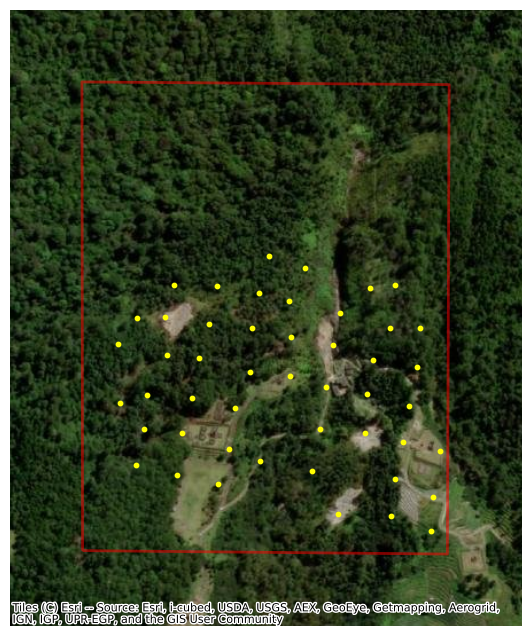

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point
import contextily as ctx

# Define coordinates for the polygon
polygon_coords = [
    (-7.204818, 110.337000),
    (-7.204850, 110.340417),
    (-7.200488, 110.340433),
    (-7.200463, 110.336994)
]

# Convert coordinates to (longitude, latitude) for correct CRS
polygon_coords = [(lon, lat) for lat, lon in polygon_coords]

# Create a GeoDataFrame with a polygon
polygon = Polygon(polygon_coords)
gdf_polygon = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

# Define coordinates for the points
# Extract coordinates from the DataFrame
points_coords = list(zip(df_data_tersortir['Longitude (Bjr)'], df_data_tersortir['Latitude (Ltg)']))

# Now points_coords contains the coordinates from your DataFrame.

# Create a GeoDataFrame with points
points = [Point(lon, lat) for lon, lat in points_coords]
gdf_points = gpd.GeoDataFrame(index=range(len(points)), crs="EPSG:4326", geometry=points)

# Convert all GeoDataFrames to Web Mercator (EPSG:3857) for contextily compatibility
gdf_polygon = gdf_polygon.to_crs(epsg=3857)
gdf_points = gdf_points.to_crs(epsg=3857)

# Plot the map
fig, ax = plt.subplots(figsize=(8, 8))
gdf_polygon.plot(ax=ax, alpha=0.5, edgecolor="red", facecolor="none", linewidth=2)
gdf_points.plot(ax=ax, color="yellow", markersize=10)

# Zoom out by setting the extent to a larger area
buffer = 75  # Adjust this value to zoom out more or less
minx, miny, maxx, maxy = gdf_polygon.total_bounds
ax.set_xlim(minx - buffer, maxx + buffer)
ax.set_ylim(miny - buffer, maxy + buffer)

# Add basemap (satellite)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Remove axis
ax.set_axis_off()

# Show the map
plt.show()

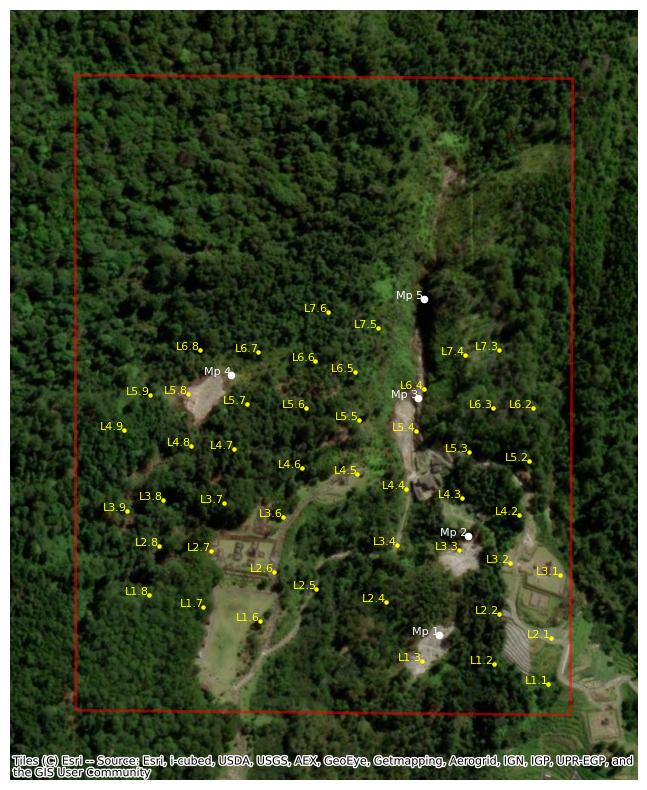

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point
import contextily as ctx

# Define coordinates for the polygon
polygon_coords = [
    (-7.204818, 110.337000),
    (-7.204850, 110.340417),
    (-7.200488, 110.340433),
    (-7.200463, 110.336994)
]

# Convert coordinates to (longitude, latitude) for correct CRS
polygon_coords = [(lon, lat) for lat, lon in polygon_coords]

# Create a GeoDataFrame with a polygon
polygon = Polygon(polygon_coords)
gdf_polygon = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

# Define coordinates for the points
# Extract coordinates from the DataFrame
points_coords = list(zip(df_data_tersortir['Longitude (Bjr)'], df_data_tersortir['Latitude (Ltg)']))

titles = list(df_data_tersortir['Title'])

# Add fumarol points
fumarol_coords = [
    (110.339507, -7.204299),
    (110.339707, -7.203623),
    (110.339367, -7.202674),
    (110.338074, -7.202516),
    (110.339402, -7.202001)
]

fumarol_titles = ["Mp 1", "Mp 2", "Mp 3", "Mp 4", "Mp 5"]

# Create a GeoDataFrame with points and titles
points = [Point(lon, lat) for lon, lat in points_coords]
gdf_points = gpd.GeoDataFrame({'title': titles}, crs="EPSG:4326", geometry=points)

# Create a GeoDataFrame for fumarol points
fumarol_points = [Point(lon, lat) for lon, lat in fumarol_coords]
gdf_fumarol = gpd.GeoDataFrame({'title': fumarol_titles}, crs="EPSG:4326", geometry=fumarol_points)

# Convert all GeoDataFrames to Web Mercator (EPSG:3857) for contextily compatibility
gdf_polygon = gdf_polygon.to_crs(epsg=3857)
gdf_points = gdf_points.to_crs(epsg=3857)
gdf_fumarol = gdf_fumarol.to_crs(epsg=3857)

# Plot the map
fig, ax = plt.subplots(figsize=(10, 10))
gdf_polygon.plot(ax=ax, alpha=0.5, edgecolor="red", facecolor="none", linewidth=2)
gdf_points.plot(ax=ax, color="yellow", markersize=5)
gdf_fumarol.plot(ax=ax, color="white", markersize=20)

# Annotate points with titles
for x, y, label in zip(gdf_points.geometry.x, gdf_points.geometry.y, gdf_points['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="yellow")

# Annotate fumarol points with titles
for x, y, label in zip(gdf_fumarol.geometry.x, gdf_fumarol.geometry.y, gdf_fumarol['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="white")

# Zoom out by setting the extent to a larger area
buffer = 50  # Adjust this value to zoom out more or less
minx, miny, maxx, maxy = gdf_polygon.total_bounds
ax.set_xlim(minx - buffer, maxx + buffer)
ax.set_ylim(miny - buffer, maxy + buffer)

# Add basemap (satellite)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Remove axis
ax.set_axis_off()

# Show the map
plt.show()

In [ ]:
# import requests
# import xml.etree.ElementTree as ET
# import csv

# # Parse the XML file
# tree = ET.parse('/content/river_up.xml')
# root = tree.getroot()

# # Extract node references
# node_refs = [nd.attrib['ref'] for nd in root.findall('.//nd')]

# # Function to fetch node details from OpenStreetMap API
# def fetch_node_details(node_id):
#     url = f"https://www.openstreetmap.org/api/0.6/node/{node_id}"
#     response = requests.get(url)
#     if response.status_code == 200:
#         node_tree = ET.fromstring(response.content)
#         node = node_tree.find('node')
#         if node is not None:
#             lat = node.attrib['lat']
#             lon = node.attrib['lon']
#             return lat, lon
#     return None, None

# # Fetch latitude and longitude for each node reference
# node_details = {}
# for node_id in node_refs:
#     lat, lon = fetch_node_details(node_id)
#     if lat and lon:
#         node_details[node_id] = (lat, lon)

# # Save the node details to a CSV file
# with open('river_up.csv', mode='w', newline='') as file:
#     writer = csv.writer(file)
#     writer.writerow(['Node ID', 'Latitude', 'Longitude'])
#     for node_id, (lat, lon) in node_details.items():
#         writer.writerow([node_id, lat, lon])

# print("Node details have been saved to csv")

In [ ]:
# Raw URLs for the CSV files
url_river_up = "https://raw.githubusercontent.com/faliqadlan/code-gas-arduino/main/river_up.csv"
url_river_bot = "https://raw.githubusercontent.com/faliqadlan/code-gas-arduino/main/river_bot.csv"

# Load the CSV files into DataFrames
df_river_up = pd.read_csv(url_river_up)
df_river_bot = pd.read_csv(url_river_bot)

# Display the first few rows of each DataFrame
print("River Up Data:")
print(df_river_up.head())

print("\nRiver Bot Data:")
print(df_river_bot.head())

River Up Data:
      Node ID  Latitude   Longitude
0  6546472910 -7.195397  110.342565
1  6546472911 -7.196329  110.342192
2  6546472912 -7.196689  110.341961
3  6546472913 -7.197063  110.341872
4  6546472915 -7.197833  110.341831

River Bot Data:
       Node ID  Latitude   Longitude
0  10824467453 -7.203415  110.339872
1  10859687489 -7.203870  110.339797
2  10833087950 -7.204343  110.339815
3  10824467456 -7.204581  110.339727
4  10824467458 -7.205081  110.339698


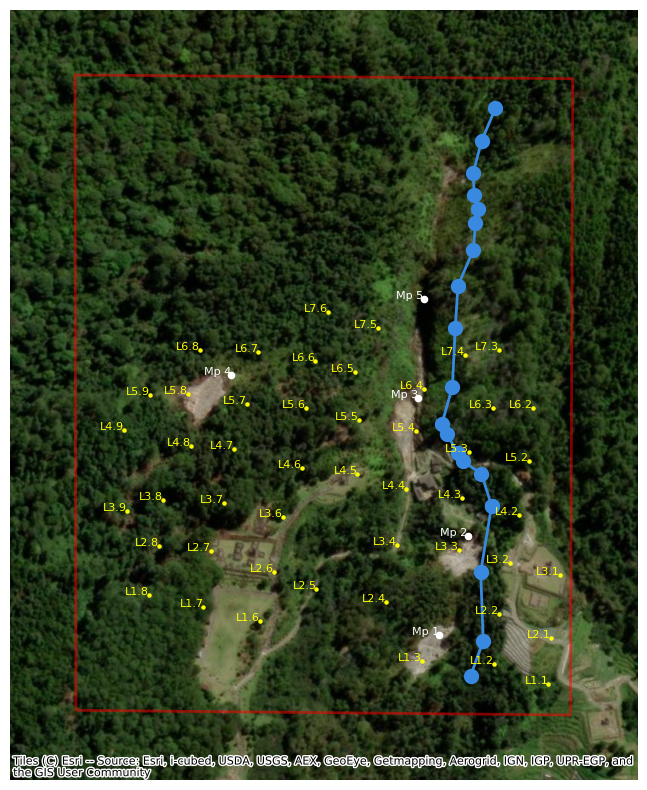

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point, LineString
import contextily as ctx

# Define coordinates for the polygon
polygon_coords = [
    (-7.204818, 110.337000),
    (-7.204850, 110.340417),
    (-7.200488, 110.340433),
    (-7.200463, 110.336994)
]

# Convert coordinates to (longitude, latitude) for correct CRS
polygon_coords = [(lon, lat) for lat, lon in polygon_coords]

# Create a GeoDataFrame with a polygon
polygon = Polygon(polygon_coords)
gdf_polygon = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

# Define coordinates for the points
points_coords = list(zip(df_data_tersortir['Longitude (Bjr)'], df_data_tersortir['Latitude (Ltg)']))
titles = list(df_data_tersortir['Title'])

# Add fumarol points
fumarol_coords = [
    (110.339507, -7.204299),
    (110.339707, -7.203623),
    (110.339367, -7.202674),
    (110.338074, -7.202516),
    (110.339402, -7.202001)
]
fumarol_titles = ["Mp 1", "Mp 2", "Mp 3", "Mp 4", "Mp 5"]

# Get coordinate river
river_coords_up = list(zip(df_river_up['Longitude'], df_river_up['Latitude']))
river_coords_bot = list(zip(df_river_bot['Longitude'], df_river_bot['Latitude']))

# Combine the two lists into one
river_coords = river_coords_up + river_coords_bot
gdf_river = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lon, lat in river_coords], crs="EPSG:4326")

# Create a GeoDataFrame with points and titles
points = [Point(lon, lat) for lon, lat in points_coords]
gdf_points = gpd.GeoDataFrame({'title': titles}, crs="EPSG:4326", geometry=points)

# Create a GeoDataFrame for fumarol points
fumarol_points = [Point(lon, lat) for lon, lat in fumarol_coords]
gdf_fumarol = gpd.GeoDataFrame({'title': fumarol_titles}, crs="EPSG:4326", geometry=fumarol_points)

# Filter river points within the polygon
gdf_river = gdf_river[gdf_river.within(gdf_polygon.loc[0, 'geometry'])]

# Create a River Line from the points
river_line = LineString(gdf_river.geometry.tolist())
gdf_river_line = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[river_line])

# Convert all GeoDataFrames to Web Mercator (EPSG:3857) for contextily compatibility
gdf_polygon = gdf_polygon.to_crs(epsg=3857)
gdf_points = gdf_points.to_crs(epsg=3857)
gdf_fumarol = gdf_fumarol.to_crs(epsg=3857)
gdf_river = gdf_river.to_crs(epsg=3857)
gdf_river_line = gdf_river_line.to_crs(epsg=3857)

# Plot the map
fig, ax = plt.subplots(figsize=(10, 10))
gdf_polygon.plot(ax=ax, alpha=0.5, edgecolor="red", facecolor="none", linewidth=2)
gdf_points.plot(ax=ax, color="yellow", markersize=5)
gdf_fumarol.plot(ax=ax, color="white", markersize=20)
gdf_river.plot(ax=ax, color="#3889DF", linewidth=5)
gdf_river_line.plot(ax=ax, color="#3889DF", linewidth=2)

# Annotate points with titles
for x, y, label in zip(gdf_points.geometry.x, gdf_points.geometry.y, gdf_points['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="yellow")

# Annotate fumarol points with titles
for x, y, label in zip(gdf_fumarol.geometry.x, gdf_fumarol.geometry.y, gdf_fumarol['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="white")

# Zoom out by setting the extent to a larger area
buffer = 50  # Adjust this value to zoom out more or less
minx, miny, maxx, maxy = gdf_polygon.total_bounds
ax.set_xlim(minx - buffer, maxx + buffer)
ax.set_ylim(miny - buffer, maxy + buffer)

# Add basemap (satellite)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Remove axis
ax.set_axis_off()

# Show the map
plt.show()

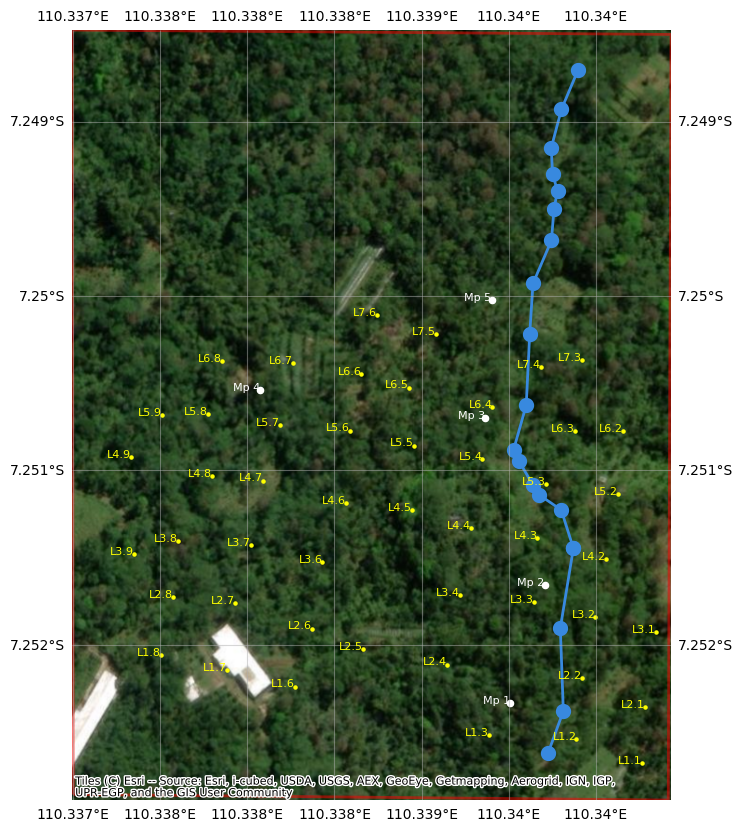

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point, LineString
import contextily as ctx
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# Define coordinates for the polygon
polygon_coords = [
    (-7.204818, 110.337000),
    (-7.204850, 110.340417),
    (-7.200488, 110.340433),
    (-7.200463, 110.336994)
]

# Convert coordinates to (longitude, latitude) for correct CRS
polygon_coords = [(lon, lat) for lat, lon in polygon_coords]

# Create a GeoDataFrame with a polygon
polygon = Polygon(polygon_coords)
gdf_polygon = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

# Define coordinates for the points
points_coords = list(zip(df_data_tersortir['Longitude (Bjr)'], df_data_tersortir['Latitude (Ltg)']))
titles = list(df_data_tersortir['Title'])

# Add fumarol points
fumarol_coords = [
    (110.339507, -7.204299),
    (110.339707, -7.203623),
    (110.339367, -7.202674),
    (110.338074, -7.202516),
    (110.339402, -7.202001)
]
fumarol_titles = ["Mp 1", "Mp 2", "Mp 3", "Mp 4", "Mp 5"]

# Get coordinate river
river_coords_up = list(zip(df_river_up['Longitude'], df_river_up['Latitude']))
river_coords_bot = list(zip(df_river_bot['Longitude'], df_river_bot['Latitude']))

# Combine the two lists into one
river_coords = river_coords_up + river_coords_bot
gdf_river = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lon, lat in river_coords], crs="EPSG:4326")

# Create a GeoDataFrame with points and titles
points = [Point(lon, lat) for lon, lat in points_coords]
gdf_points = gpd.GeoDataFrame({'title': titles}, crs="EPSG:4326", geometry=points)

# Create a GeoDataFrame for fumarol points
fumarol_points = [Point(lon, lat) for lon, lat in fumarol_coords]
gdf_fumarol = gpd.GeoDataFrame({'title': fumarol_titles}, crs="EPSG:4326", geometry=fumarol_points)

# Filter river points within the polygon
gdf_river = gdf_river[gdf_river.within(gdf_polygon.loc[0, 'geometry'])]

# Create a River Line from the points
river_line = LineString(gdf_river.geometry.tolist())
gdf_river_line = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[river_line])

# Convert all GeoDataFrames to Web Mercator (EPSG:3857) for contextily compatibility
gdf_polygon = gdf_polygon.to_crs(epsg=3857)
gdf_points = gdf_points.to_crs(epsg=3857)
gdf_fumarol = gdf_fumarol.to_crs(epsg=3857)
gdf_river = gdf_river.to_crs(epsg=3857)
gdf_river_line = gdf_river_line.to_crs(epsg=3857)

# Plot the map with Cartopy
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': ccrs.Mercator()})
ax.set_extent([gdf_polygon.total_bounds[0], gdf_polygon.total_bounds[2], gdf_polygon.total_bounds[1], gdf_polygon.total_bounds[3]], crs=ccrs.Mercator())

# Add features to the map
gdf_polygon.plot(ax=ax, alpha=0.5, edgecolor="red", facecolor="none", linewidth=2, transform=ccrs.Mercator())
gdf_points.plot(ax=ax, color="yellow", markersize=5, transform=ccrs.Mercator())
gdf_fumarol.plot(ax=ax, color="white", markersize=20, transform=ccrs.Mercator())
gdf_river.plot(ax=ax, color="#3889DF", linewidth=5, transform=ccrs.Mercator())
gdf_river_line.plot(ax=ax, color="#3889DF", linewidth=2, transform=ccrs.Mercator())

# Annotate points with titles
for x, y, label in zip(gdf_points.geometry.x, gdf_points.geometry.y, gdf_points['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="yellow", transform=ccrs.Mercator())

# Annotate fumarol points with titles
for x, y, label in zip(gdf_fumarol.geometry.x, gdf_fumarol.geometry.y, gdf_fumarol['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="white", transform=ccrs.Mercator())

# Add basemap (satellite)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, crs=ccrs.Mercator())

# Add gridlines and labels
gl = ax.gridlines(draw_labels=True, alpha=0.5)
gl.top_labels = True
gl.right_labels = True
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

# Remove axis
ax.set_axis_off()

# Show the map
plt.show()

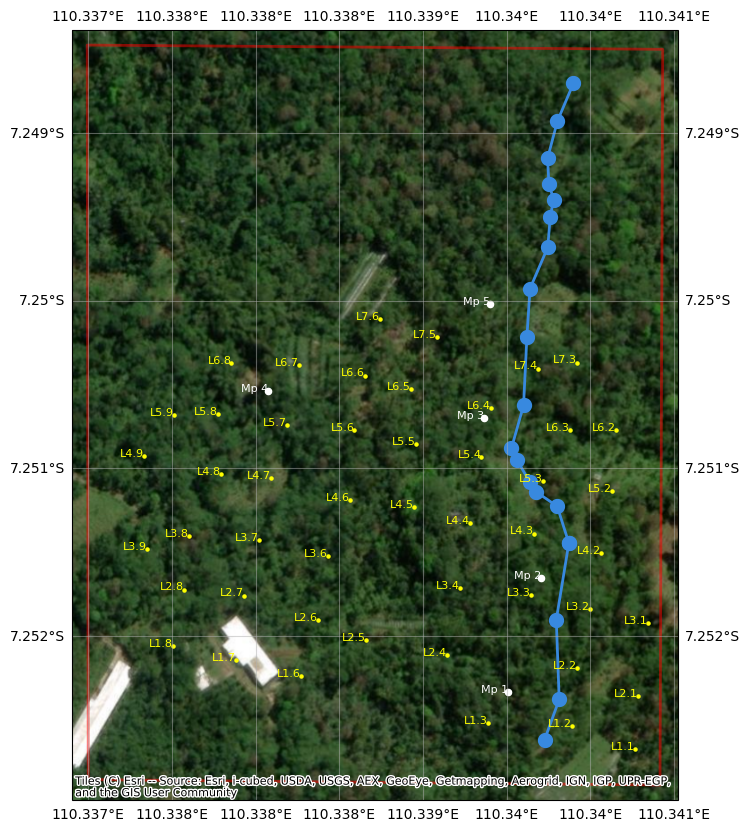

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point, LineString
import contextily as ctx
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# Define coordinates for the polygon
polygon_coords = [
    (-7.204818, 110.337000),
    (-7.204850, 110.340417),
    (-7.200488, 110.340433),
    (-7.200463, 110.336994)
]

# Convert coordinates to (longitude, latitude) for correct CRS
polygon_coords = [(lon, lat) for lat, lon in polygon_coords]

# Create a GeoDataFrame with a polygon
polygon = Polygon(polygon_coords)
gdf_polygon = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

# Define coordinates for the points
points_coords = list(zip(df_data_tersortir['Longitude (Bjr)'], df_data_tersortir['Latitude (Ltg)']))
titles = list(df_data_tersortir['Title'])

# Add fumarol points
fumarol_coords = [
    (110.339507, -7.204299),
    (110.339707, -7.203623),
    (110.339367, -7.202674),
    (110.338074, -7.202516),
    (110.339402, -7.202001)
]
fumarol_titles = ["Mp 1", "Mp 2", "Mp 3", "Mp 4", "Mp 5"]

# Get coordinate river
river_coords_up = list(zip(df_river_up['Longitude'], df_river_up['Latitude']))
river_coords_bot = list(zip(df_river_bot['Longitude'], df_river_bot['Latitude']))

# Combine the two lists into one
river_coords = river_coords_up + river_coords_bot
gdf_river = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lon, lat in river_coords], crs="EPSG:4326")

# Create a GeoDataFrame with points and titles
points = [Point(lon, lat) for lon, lat in points_coords]
gdf_points = gpd.GeoDataFrame({'title': titles}, crs="EPSG:4326", geometry=points)

# Create a GeoDataFrame for fumarol points
fumarol_points = [Point(lon, lat) for lon, lat in fumarol_coords]
gdf_fumarol = gpd.GeoDataFrame({'title': fumarol_titles}, crs="EPSG:4326", geometry=fumarol_points)

# Filter river points within the polygon
gdf_river = gdf_river[gdf_river.within(gdf_polygon.loc[0, 'geometry'])]

# Create a River Line from the points
river_line = LineString(gdf_river.geometry.tolist())
gdf_river_line = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[river_line])

# Convert all GeoDataFrames to Web Mercator (EPSG:3857) for contextily compatibility
gdf_polygon = gdf_polygon.to_crs(epsg=3857)
gdf_points = gdf_points.to_crs(epsg=3857)
gdf_fumarol = gdf_fumarol.to_crs(epsg=3857)
gdf_river = gdf_river.to_crs(epsg=3857)
gdf_river_line = gdf_river_line.to_crs(epsg=3857)

# Plot the map with Cartopy
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': ccrs.Mercator()})

# Add a buffer to the extent
buffer = 10  # Adjust this value to add more or less buffer
minx, miny, maxx, maxy = gdf_polygon.total_bounds
ax.set_extent([minx - buffer, maxx + buffer, miny - buffer, maxy + buffer], crs=ccrs.Mercator())

# Add features to the map
gdf_polygon.plot(ax=ax, alpha=0.5, edgecolor="red", facecolor="none", linewidth=2, transform=ccrs.Mercator())
gdf_points.plot(ax=ax, color="yellow", markersize=5, transform=ccrs.Mercator())
gdf_fumarol.plot(ax=ax, color="white", markersize=20, transform=ccrs.Mercator())
gdf_river.plot(ax=ax, color="#3889DF", linewidth=5, transform=ccrs.Mercator())
gdf_river_line.plot(ax=ax, color="#3889DF", linewidth=2, transform=ccrs.Mercator())

# Annotate points with titles
for x, y, label in zip(gdf_points.geometry.x, gdf_points.geometry.y, gdf_points['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="yellow", transform=ccrs.Mercator())

# Annotate fumarol points with titles
for x, y, label in zip(gdf_fumarol.geometry.x, gdf_fumarol.geometry.y, gdf_fumarol['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="white", transform=ccrs.Mercator())

# Add basemap (satellite)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, crs=ccrs.Mercator())

# Add gridlines and labels
gl = ax.gridlines(draw_labels=True, alpha=0.5)
gl.top_labels = True
gl.right_labels = True
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

# Show the map
plt.show()

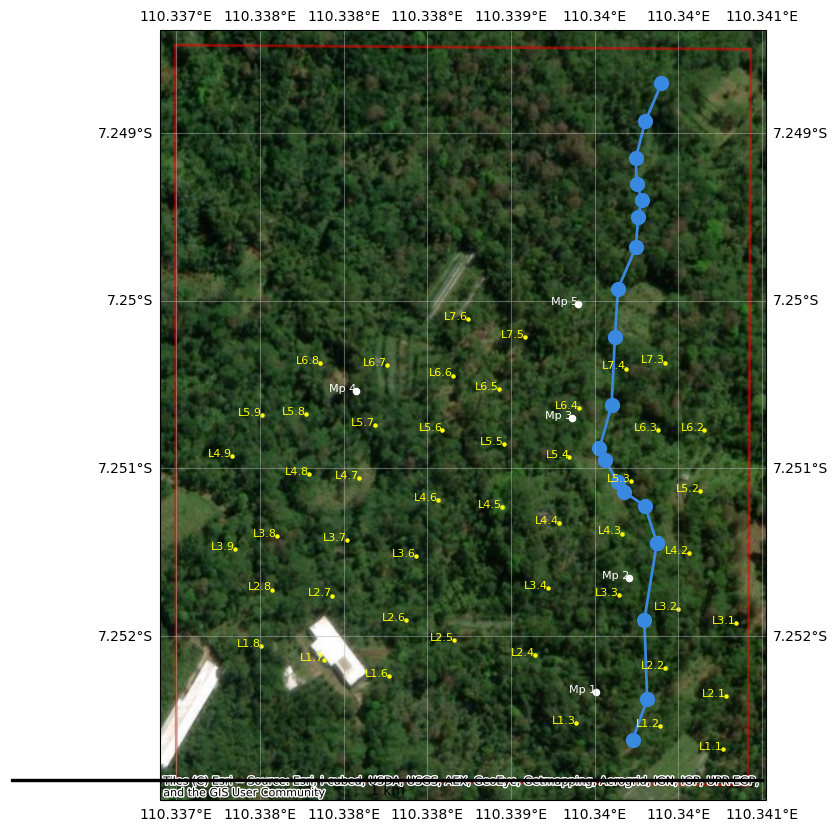

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point, LineString
import contextily as ctx
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm

# Define coordinates for the polygon
polygon_coords = [
    (-7.204818, 110.337000),
    (-7.204850, 110.340417),
    (-7.200488, 110.340433),
    (-7.200463, 110.336994)
]

# Convert coordinates to (longitude, latitude) for correct CRS
polygon_coords = [(lon, lat) for lat, lon in polygon_coords]

# Create a GeoDataFrame with a polygon
polygon = Polygon(polygon_coords)
gdf_polygon = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

# Define coordinates for the points
points_coords = list(zip(df_data_tersortir['Longitude (Bjr)'], df_data_tersortir['Latitude (Ltg)']))
titles = list(df_data_tersortir['Title'])

# Add fumarol points
fumarol_coords = [
    (110.339507, -7.204299),
    (110.339707, -7.203623),
    (110.339367, -7.202674),
    (110.338074, -7.202516),
    (110.339402, -7.202001)
]
fumarol_titles = ["Mp 1", "Mp 2", "Mp 3", "Mp 4", "Mp 5"]

# Get coordinate river
river_coords_up = list(zip(df_river_up['Longitude'], df_river_up['Latitude']))
river_coords_bot = list(zip(df_river_bot['Longitude'], df_river_bot['Latitude']))

# Combine the two lists into one
river_coords = river_coords_up + river_coords_bot
gdf_river = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lon, lat in river_coords], crs="EPSG:4326")

# Create a GeoDataFrame with points and titles
points = [Point(lon, lat) for lon, lat in points_coords]
gdf_points = gpd.GeoDataFrame({'title': titles}, crs="EPSG:4326", geometry=points)

# Create a GeoDataFrame for fumarol points
fumarol_points = [Point(lon, lat) for lon, lat in fumarol_coords]
gdf_fumarol = gpd.GeoDataFrame({'title': fumarol_titles}, crs="EPSG:4326", geometry=fumarol_points)

# Filter river points within the polygon
gdf_river = gdf_river[gdf_river.within(gdf_polygon.loc[0, 'geometry'])]

# Create a River Line from the points
river_line = LineString(gdf_river.geometry.tolist())
gdf_river_line = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[river_line])

# Convert all GeoDataFrames to Web Mercator (EPSG:3857) for contextily compatibility
gdf_polygon = gdf_polygon.to_crs(epsg=3857)
gdf_points = gdf_points.to_crs(epsg=3857)
gdf_fumarol = gdf_fumarol.to_crs(epsg=3857)
gdf_river = gdf_river.to_crs(epsg=3857)
gdf_river_line = gdf_river_line.to_crs(epsg=3857)

# Plot the map with Cartopy
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': ccrs.Mercator()})

# Add a buffer to the extent
buffer = 10  # Adjust this value to add more or less buffer
minx, miny, maxx, maxy = gdf_polygon.total_bounds
ax.set_extent([minx - buffer, maxx + buffer, miny - buffer, maxy + buffer], crs=ccrs.Mercator())

# Add features to the map
gdf_polygon.plot(ax=ax, alpha=0.5, edgecolor="red", facecolor="none", linewidth=2, transform=ccrs.Mercator())
gdf_points.plot(ax=ax, color="yellow", markersize=5, transform=ccrs.Mercator())
gdf_fumarol.plot(ax=ax, color="white", markersize=20, transform=ccrs.Mercator())
gdf_river.plot(ax=ax, color="#3889DF", linewidth=5, transform=ccrs.Mercator())
gdf_river_line.plot(ax=ax, color="#3889DF", linewidth=2, transform=ccrs.Mercator())

# Annotate points with titles
for x, y, label in zip(gdf_points.geometry.x, gdf_points.geometry.y, gdf_points['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="yellow", transform=ccrs.Mercator())

# Annotate fumarol points with titles
for x, y, label in zip(gdf_fumarol.geometry.x, gdf_fumarol.geometry.y, gdf_fumarol['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="white", transform=ccrs.Mercator())

# Add basemap (satellite)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, crs=ccrs.Mercator())

# Add gridlines and labels
gl = ax.gridlines(draw_labels=True, alpha=0.5)
gl.top_labels = True
gl.right_labels = True
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

# Add scale bar
fontprops = fm.FontProperties(size=10)
scalebar = AnchoredSizeBar(ax.transData,
                           500,  # length of the scale bar in data units
                           '1 km',  # label for the scale bar
                           'lower right',  # location of the scale bar
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=1,
                           fontproperties=fontprops)

ax.add_artist(scalebar)

# Show the map
plt.show()

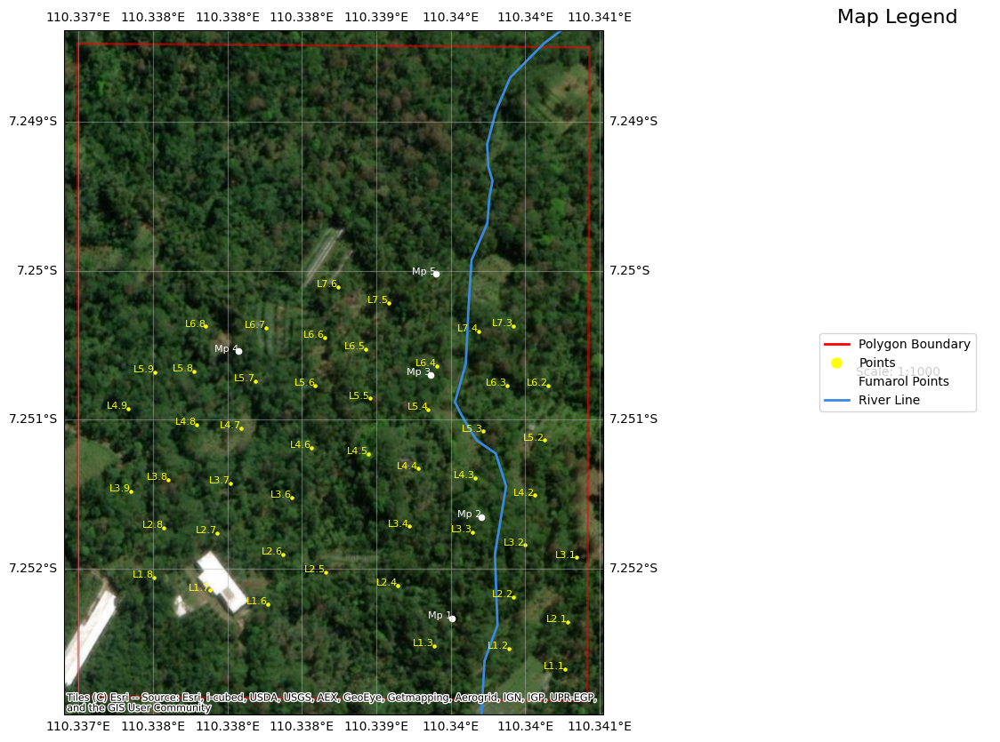

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point, LineString
import contextily as ctx
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from matplotlib.lines import Line2D

# Define coordinates for the polygon
polygon_coords = [
    (-7.204818, 110.337000),
    (-7.204850, 110.340417),
    (-7.200488, 110.340433),
    (-7.200463, 110.336994)
]

# Convert coordinates to (longitude, latitude) for correct CRS
polygon_coords = [(lon, lat) for lat, lon in polygon_coords]

# Create a GeoDataFrame with a polygon
polygon = Polygon(polygon_coords)
gdf_polygon = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

# Define coordinates for the points
points_coords = list(zip(df_data_tersortir['Longitude (Bjr)'], df_data_tersortir['Latitude (Ltg)']))
titles = list(df_data_tersortir['Title'])

# Add fumarol points
fumarol_coords = [
    (110.339507, -7.204299),
    (110.339707, -7.203623),
    (110.339367, -7.202674),
    (110.338074, -7.202516),
    (110.339402, -7.202001)
]
fumarol_titles = ["Mp 1", "Mp 2", "Mp 3", "Mp 4", "Mp 5"]

# Get coordinate river
river_coords_up = list(zip(df_river_up['Longitude'], df_river_up['Latitude']))
river_coords_bot = list(zip(df_river_bot['Longitude'], df_river_bot['Latitude']))

# Combine the two lists into one
river_coords = river_coords_up + river_coords_bot

# Create a GeoDataFrame with points and titles
points = [Point(lon, lat) for lon, lat in points_coords]
gdf_points = gpd.GeoDataFrame({'title': titles}, crs="EPSG:4326", geometry=points)

# Create a GeoDataFrame for fumarol points
fumarol_points = [Point(lon, lat) for lon, lat in fumarol_coords]
gdf_fumarol = gpd.GeoDataFrame({'title': fumarol_titles}, crs="EPSG:4326", geometry=fumarol_points)

# Create a River Line from the points
river_line = LineString(river_coords)
gdf_river_line = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[river_line])

# Convert all GeoDataFrames to Web Mercator (EPSG:3857) for contextily compatibility
gdf_polygon = gdf_polygon.to_crs(epsg=3857)
gdf_points = gdf_points.to_crs(epsg=3857)
gdf_fumarol = gdf_fumarol.to_crs(epsg=3857)
gdf_river_line = gdf_river_line.to_crs(epsg=3857)

# Create a figure with GridSpec layout
fig = plt.figure(figsize=(15, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[4, 1])

# Plot the map with Cartopy
ax = fig.add_subplot(gs[0], projection=ccrs.Mercator())

# Add a buffer to the extent
buffer = 10  # Adjust this value to add more or less buffer
minx, miny, maxx, maxy = gdf_polygon.total_bounds
ax.set_extent([minx - buffer, maxx + buffer, miny - buffer, maxy + buffer], crs=ccrs.Mercator())

# Add features to the map
gdf_polygon.plot(ax=ax, alpha=0.5, edgecolor="red", facecolor="none", linewidth=2, transform=ccrs.Mercator())
gdf_points.plot(ax=ax, color="yellow", markersize=5, transform=ccrs.Mercator())
gdf_fumarol.plot(ax=ax, color="white", markersize=20, transform=ccrs.Mercator())
gdf_river_line.plot(ax=ax, color="#3889DF", linewidth=2, transform=ccrs.Mercator())

# Annotate points with titles
for x, y, label in zip(gdf_points.geometry.x, gdf_points.geometry.y, gdf_points['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="yellow", transform=ccrs.Mercator())

# Annotate fumarol points with titles
for x, y, label in zip(gdf_fumarol.geometry.x, gdf_fumarol.geometry.y, gdf_fumarol['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="white", transform=ccrs.Mercator())

# Add basemap (satellite)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, crs=ccrs.Mercator())

# Add gridlines and labels
gl = ax.gridlines(draw_labels=True, alpha=0.5)
gl.top_labels = True
gl.right_labels = True
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

# Add legend, scale, and title to the right subplot
ax_legend = fig.add_subplot(gs[1])

# Hide the axis
ax_legend.axis('off')

# Add title
ax_legend.set_title("Map Legend", fontsize=16)

# Add custom legend
legend_elements = [
    Line2D([0], [0], color='red', lw=2, label='Polygon Boundary'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='yellow', markersize=10, label='Points'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='white', markersize=10, label='Fumarol Points'),
    Line2D([0], [0], color='#3889DF', lw=2, label='River Line')
]
ax_legend.legend(handles=legend_elements, loc='center')

# Add scale bar
scale_bar = Line2D([0], [0], color='black', lw=2)
ax_legend.add_line(scale_bar)
ax_legend.text(0.5, 0.5, 'Scale: 1:1000', transform=ax_legend.transAxes, ha='center', va='center')

# Show the map
plt.show()

# map scale

Longitude gridlines in geographic coordinates: [110.33683241337799, 110.33737140254846, 110.33791039171894, 110.33844938088939, 110.33898837005987, 110.33952735923033, 110.34006634840081, 110.34060533757128]


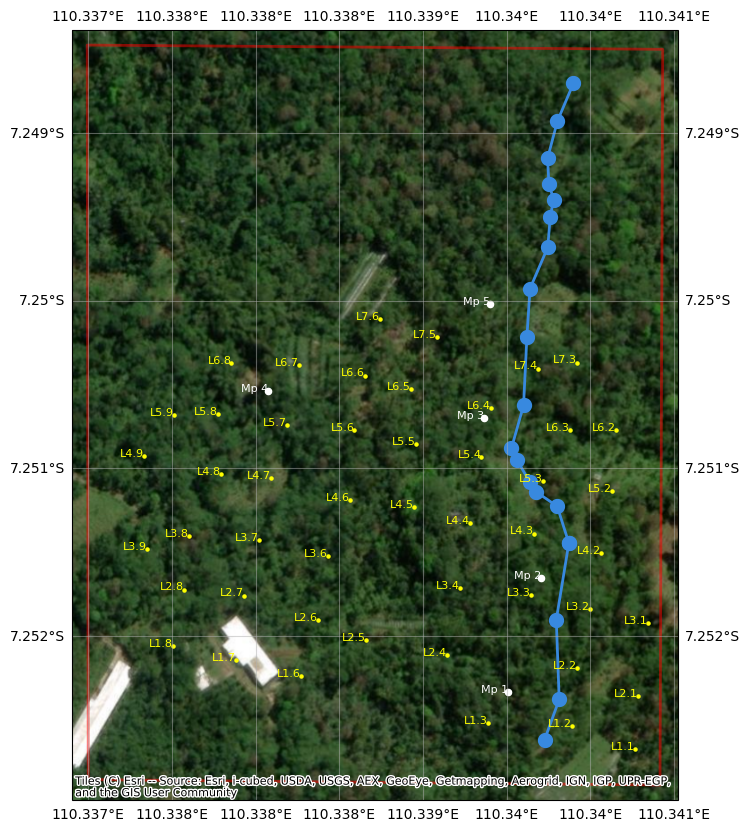

In [37]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point, LineString
import contextily as ctx
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from pyproj import Transformer
import math
from geopy.distance import geodesic

# Define coordinates for the polygon
polygon_coords = [
    (-7.204818, 110.337000),
    (-7.204850, 110.340417),
    (-7.200488, 110.340433),
    (-7.200463, 110.336994)
]

# Convert coordinates to (longitude, latitude) for correct CRS
polygon_coords = [(lon, lat) for lat, lon in polygon_coords]

# Create a GeoDataFrame with a polygon
polygon = Polygon(polygon_coords)
gdf_polygon = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

# Define coordinates for the points
points_coords = list(zip(df_data_tersortir['Longitude (Bjr)'], df_data_tersortir['Latitude (Ltg)']))
titles = list(df_data_tersortir['Title'])

# Add fumarol points
fumarol_coords = [
    (110.339507, -7.204299),
    (110.339707, -7.203623),
    (110.339367, -7.202674),
    (110.338074, -7.202516),
    (110.339402, -7.202001)
]
fumarol_titles = ["Mp 1", "Mp 2", "Mp 3", "Mp 4", "Mp 5"]

# Get coordinate river
river_coords_up = list(zip(df_river_up['Longitude'], df_river_up['Latitude']))
river_coords_bot = list(zip(df_river_bot['Longitude'], df_river_bot['Latitude']))

# Combine the two lists into one
river_coords = river_coords_up + river_coords_bot
gdf_river = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lon, lat in river_coords], crs="EPSG:4326")

# Create a GeoDataFrame with points and titles
points = [Point(lon, lat) for lon, lat in points_coords]
gdf_points = gpd.GeoDataFrame({'title': titles}, crs="EPSG:4326", geometry=points)

# Create a GeoDataFrame for fumarol points
fumarol_points = [Point(lon, lat) for lon, lat in fumarol_coords]
gdf_fumarol = gpd.GeoDataFrame({'title': fumarol_titles}, crs="EPSG:4326", geometry=fumarol_points)

# Filter river points within the polygon
gdf_river = gdf_river[gdf_river.within(gdf_polygon.loc[0, 'geometry'])]

# Create a River Line from the points
river_line = LineString(gdf_river.geometry.tolist())
gdf_river_line = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[river_line])

# Convert all GeoDataFrames to Web Mercator (EPSG:3857) for contextily compatibility
gdf_polygon = gdf_polygon.to_crs(epsg=3857)
gdf_points = gdf_points.to_crs(epsg=3857)
gdf_fumarol = gdf_fumarol.to_crs(epsg=3857)
gdf_river = gdf_river.to_crs(epsg=3857)
gdf_river_line = gdf_river_line.to_crs(epsg=3857)

# Plot the map with Cartopy
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': ccrs.Mercator()})

# Add a buffer to the extent
buffer = 10  # Adjust this value to add more or less buffer
minx, miny, maxx, maxy = gdf_polygon.total_bounds
ax.set_extent([minx - buffer, maxx + buffer, miny - buffer, maxy + buffer], crs=ccrs.Mercator())

# Add features to the map
gdf_polygon.plot(ax=ax, alpha=0.5, edgecolor="red", facecolor="none", linewidth=2, transform=ccrs.Mercator())
gdf_points.plot(ax=ax, color="yellow", markersize=5, transform=ccrs.Mercator())
gdf_fumarol.plot(ax=ax, color="white", markersize=20, transform=ccrs.Mercator())
gdf_river.plot(ax=ax, color="#3889DF", linewidth=5, transform=ccrs.Mercator())
gdf_river_line.plot(ax=ax, color="#3889DF", linewidth=2, transform=ccrs.Mercator())

# Annotate points with titles
for x, y, label in zip(gdf_points.geometry.x, gdf_points.geometry.y, gdf_points['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="yellow", transform=ccrs.Mercator())

# Annotate fumarol points with titles
for x, y, label in zip(gdf_fumarol.geometry.x, gdf_fumarol.geometry.y, gdf_fumarol['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="white", transform=ccrs.Mercator())

# Add basemap (satellite)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, crs=ccrs.Mercator())

# Add gridlines and labels
gl = ax.gridlines(draw_labels=True, alpha=0.5)
gl.top_labels = True
gl.right_labels = True
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

# Get the gridline intervals (assume they are evenly spaced)
gridline_lons = gl.xlocator.tick_values(minx, maxx)  # Longitude gridlines
# gridline_lats = gl.ylocator.tick_values(maxy, miny)  # Latitude gridlines

# Create a transformer to convert from EPSG:3857 to EPSG:4326
transformer = Transformer.from_crs("EPSG:3857", "EPSG:4326", always_xy=True)

# Convert gridline longitude values to geographic coordinates
gridline_lons_geo = [transformer.transform(lon, 0)[0] for lon in gridline_lons]

# Convert gridline latitude values to geographic coordinates
# gridline_lats_geo = [transformer.transform(0, lat)[1] for lat in gridline_lats]

print("Longitude gridlines in geographic coordinates:", gridline_lons_geo)
# print("Latitude gridlines in geographic coordinates:", gridline_lats_geo)

# Show the map
plt.show()

In [36]:
# Calculate distances between consecutive longitude gridlines at the center latitude
center_lat = (minx + maxx) / 2
lon_distances = [
    geodesic((center_lat, lon1), (center_lat, lon2)).kilometers
    for lon1, lon2 in zip(gridline_lons_geo[:-1], gridline_lons_geo[1:])
]

/usr/local/lib/python3.11/dist-packages/geopy/point.py:472: UserWarning: Latitude normalization has been prohibited in the newer versions of geopy, because the normalized value happened to be on a different pole, which is probably not what was meant. If you pass coordinates as positional args, please make sure that the order is (latitude, longitude) or (y, x) in Cartesian terms.
  return cls(*args)


ValueError: Latitude must be in the [-90; 90] range.

# ndir

In [ ]:
!pip install pykrige

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 979.6/979.6 kB 10.4 MB/s eta 0:00:00


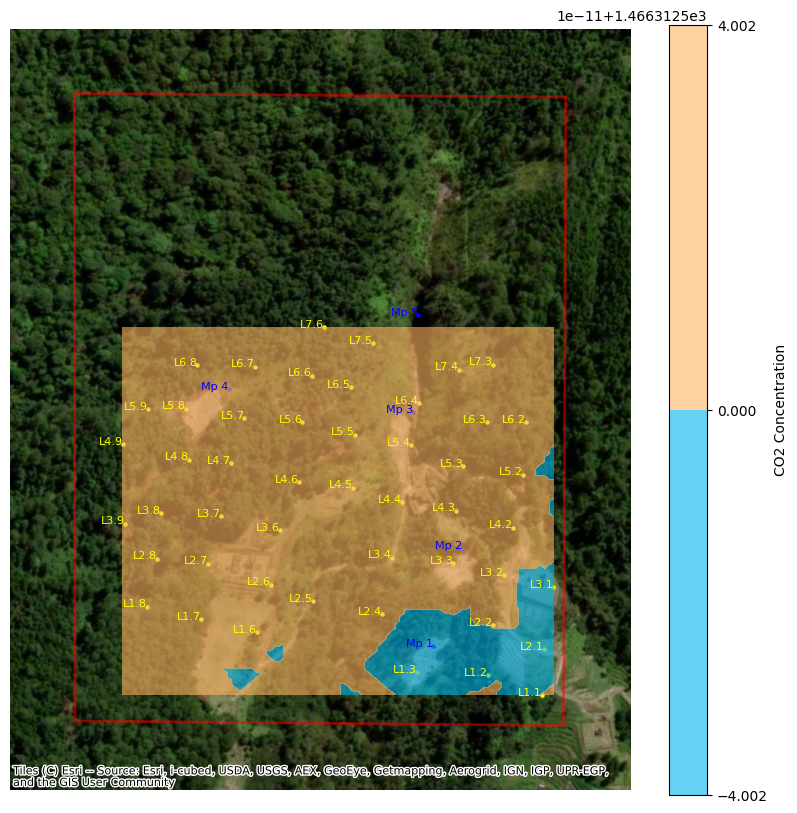

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point
import contextily as ctx
import numpy as np
from pykrige.ok import OrdinaryKriging

# Define coordinates for the polygon
polygon_coords = [
    (-7.204818, 110.337000),
    (-7.204850, 110.340417),
    (-7.200488, 110.340433),
    (-7.200463, 110.336994)
]

# Convert coordinates to (longitude, latitude) for correct CRS
polygon_coords = [(lon, lat) for lat, lon in polygon_coords]

# Create a GeoDataFrame with a polygon
polygon = Polygon(polygon_coords)
gdf_polygon = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

# Define coordinates and titles for the points
points_coords = [
    (110.340282500, -7.204321826),
    (110.340265203, -7.204637578),
    (110.339923325, -7.204155199),
    (110.339999111, -7.203808344),
    (110.340346166, -7.203891272),
    (110.340061679, -7.203476964),
    (110.340130364, -7.203108569),
    (110.340156030, -7.202746279),
    (110.339879416, -7.202746010),
    (110.339922366, -7.202345407),
    (110.339688363, -7.202380672),
    (110.339715638, -7.203048858),
    (110.339349621, -7.202905524),
    (110.339407205, -7.202613039),
    (110.339284386, -7.203298314),
    (110.339219544, -7.203683904),
    (110.338661949, -7.203988964),
    (110.338271658, -7.204203318),
    (110.339145774, -7.204078214),
    (110.337881229, -7.204110972),
    (110.338371198, -7.203872901),
    (110.339646716, -7.203721476),
    (110.339665661, -7.203359295),
    (110.339890050, -7.204500501),
    (110.339388638, -7.204480637),
    (110.337930404, -7.203726539),
    (110.338430907, -7.203491964),
    (110.338945535, -7.203199682),
    (110.338563736, -7.203159389),
    (110.338590006, -7.202745123),
    (110.338956529, -7.202830510),
    (110.338929504, -7.202499728),
    (110.338654690, -7.202422309),
    (110.339084543, -7.202194797),
    (110.338742183, -7.202085015),
    (110.338261188, -7.202359577),
    (110.337856066, -7.202350282),
    (110.337773186, -7.202651341),
    (110.337510278, -7.202655390),
    (110.337333416, -7.202897510),
    (110.338184900, -7.202715148),
    (110.338091369, -7.203029635),
    (110.337794136, -7.203004380),
    (110.338021540, -7.203395771),
    (110.337575025, -7.203690954),
    (110.337603677, -7.203374884),
    (110.337349813, -7.203449699),
    (110.337503729, -7.204024966)
]

titles = [
    "L2.1", "L1.1", "L2.2", "L3.2", "L3.1", "L4.2", "L5.2", "L6.2", "L6.3", "L7.3",
    "L7.4", "L5.3", "L5.4", "L6.4", "L4.4", "L3.4", "L2.5", "L1.6", "L2.4", "L1.7",
    "L2.6", "L3.3", "L4.3", "L1.2", "L1.3", "L2.7", "L3.6", "L4.5", "L4.6", "L5.6",
    "L5.5", "L6.5", "L6.6", "L7.5", "L7.6", "L6.7", "L6.8", "L5.8", "L5.9", "L4.9",
    "L5.7", "L4.7", "L4.8", "L3.7", "L2.8", "L3.8", "L3.9", "L1.8"
]

# CO2 measurements
co2_measurements = [
    671, 825, 656, 581, 656, 581, 656, 565, 565, 581, 565, 781, 565, 565, 687, 871,
    1850, 671, 656, 734, 656, 718, 5000, 3787, 734, 612, 687, 671, 596, 687, 918, 596,
    5000, 5000, 5000, 2934, 703, 581, 596, 5000, 1787, 765, 5000, 5000, 687, 687, 918, 781
]

# Add fumarol points
fumarol_coords = [
    (110.339507, -7.204299),
    (110.339707, -7.203623),
    (110.339367, -7.202674),
    (110.338074, -7.202516),
    (110.339402, -7.202001)
]

fumarol_titles = ["Mp 1", "Mp 2", "Mp 3", "Mp 4", "Mp 5"]

# Create a GeoDataFrame with points and titles
points = [Point(lon, lat) for lon, lat in points_coords]
gdf_points = gpd.GeoDataFrame({'title': titles, 'co2': co2_measurements}, crs="EPSG:4326", geometry=points)

# Create a GeoDataFrame for fumarol points
fumarol_points = [Point(lon, lat) for lon, lat in fumarol_coords]
gdf_fumarol = gpd.GeoDataFrame({'title': fumarol_titles}, crs="EPSG:4326", geometry=fumarol_points)

# Convert all GeoDataFrames to Web Mercator (EPSG:3857) for contextily compatibility
gdf_polygon = gdf_polygon.to_crs(epsg=3857)
gdf_points = gdf_points.to_crs(epsg=3857)
gdf_fumarol = gdf_fumarol.to_crs(epsg=3857)

# Extract coordinates and CO2 measurements for kriging
x = gdf_points.geometry.x
y = gdf_points.geometry.y
z = gdf_points['co2']

# Create grid for interpolation
gridx = np.linspace(x.min(), x.max(), 100)
gridy = np.linspace(y.min(), y.max(), 100)

# Perform kriging interpolation
OK = OrdinaryKriging(x, y, z, variogram_model='linear', verbose=False, enable_plotting=False)
z_interp, ss = OK.execute('grid', gridx, gridy)

# Plot the map
fig, ax = plt.subplots(figsize=(10, 10))
gdf_polygon.plot(ax=ax, alpha=0.5, edgecolor="red", facecolor="none", linewidth=2)
gdf_points.plot(ax=ax, color="yellow", markersize=5)
gdf_fumarol.plot(ax=ax, color="blue", markersize=5)

# Annotate points with titles
for x, y, label in zip(gdf_points.geometry.x, gdf_points.geometry.y, gdf_points['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="yellow")

# Annotate fumarol points with titles
for x, y, label in zip(gdf_fumarol.geometry.x, gdf_fumarol.geometry.y, gdf_fumarol['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="blue")

# Plot kriging interpolation
c = ax.contourf(gridx, gridy, z_interp, cmap='rainbow', alpha=0.6)

# Add color bar
fig.colorbar(c, ax=ax, label='CO2 Concentration')

# Zoom out by setting the extent to a larger area
buffer = 50  # Adjust this value to zoom out more or less
minx, miny, maxx, maxy = gdf_polygon.total_bounds
ax.set_xlim(minx - buffer, maxx + buffer)
ax.set_ylim(miny - buffer, maxy + buffer)

# Add basemap (satellite)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Remove axis
ax.set_axis_off()

# Show the map
plt.show()

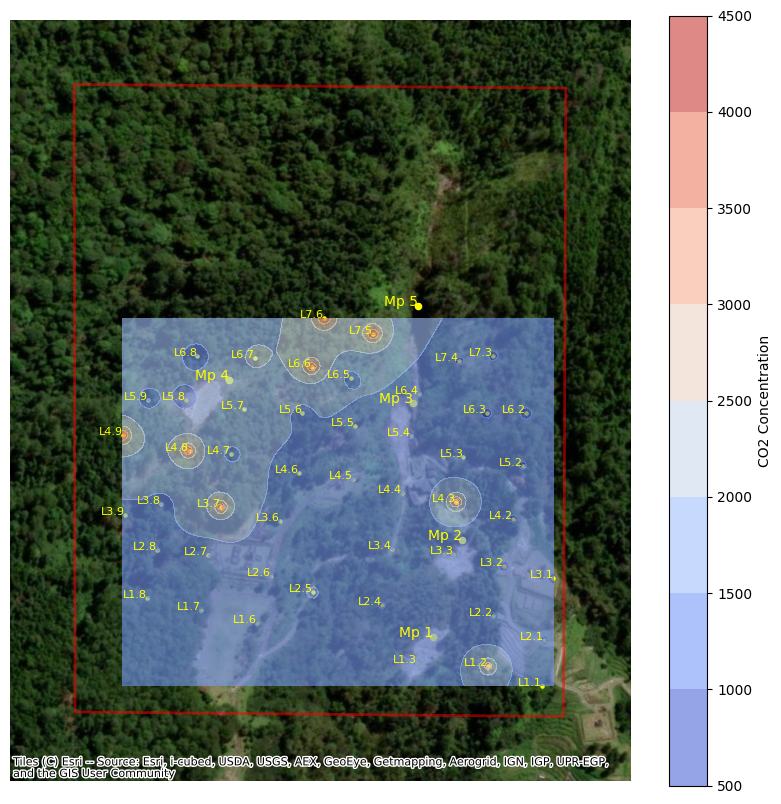

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point
import contextily as ctx
import numpy as np
from scipy.interpolate import griddata

# Define coordinates for the polygon
polygon_coords = [
    (-7.204818, 110.337000),
    (-7.204850, 110.340417),
    (-7.200488, 110.340433),
    (-7.200463, 110.336994)
]

# Convert coordinates to (longitude, latitude) for correct CRS
polygon_coords = [(lon, lat) for lat, lon in polygon_coords]

# Create a GeoDataFrame with a polygon
polygon = Polygon(polygon_coords)
gdf_polygon = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

# Define coordinates and titles for the points
points_coords = [
    (110.340282500, -7.204321826),
    (110.340265203, -7.204637578),
    (110.339923325, -7.204155199),
    (110.339999111, -7.203808344),
    (110.340346166, -7.203891272),
    (110.340061679, -7.203476964),
    (110.340130364, -7.203108569),
    (110.340156030, -7.202746279),
    (110.339879416, -7.202746010),
    (110.339922366, -7.202345407),
    (110.339688363, -7.202380672),
    (110.339715638, -7.203048858),
    (110.339349621, -7.202905524),
    (110.339407205, -7.202613039),
    (110.339284386, -7.203298314),
    (110.339219544, -7.203683904),
    (110.338661949, -7.203988964),
    (110.338271658, -7.204203318),
    (110.339145774, -7.204078214),
    (110.337881229, -7.204110972),
    (110.338371198, -7.203872901),
    (110.339646716, -7.203721476),
    (110.339665661, -7.203359295),
    (110.339890050, -7.204500501),
    (110.339388638, -7.204480637),
    (110.337930404, -7.203726539),
    (110.338430907, -7.203491964),
    (110.338945535, -7.203199682),
    (110.338563736, -7.203159389),
    (110.338590006, -7.202745123),
    (110.338956529, -7.202830510),
    (110.338929504, -7.202499728),
    (110.338654690, -7.202422309),
    (110.339084543, -7.202194797),
    (110.338742183, -7.202085015),
    (110.338261188, -7.202359577),
    (110.337856066, -7.202350282),
    (110.337773186, -7.202651341),
    (110.337510278, -7.202655390),
    (110.337333416, -7.202897510),
    (110.338184900, -7.202715148),
    (110.338091369, -7.203029635),
    (110.337794136, -7.203004380),
    (110.338021540, -7.203395771),
    (110.337575025, -7.203690954),
    (110.337603677, -7.203374884),
    (110.337349813, -7.203449699),
    (110.337503729, -7.204024966)
]

titles = [
    "L2.1", "L1.1", "L2.2", "L3.2", "L3.1", "L4.2", "L5.2", "L6.2", "L6.3", "L7.3",
    "L7.4", "L5.3", "L5.4", "L6.4", "L4.4", "L3.4", "L2.5", "L1.6", "L2.4", "L1.7",
    "L2.6", "L3.3", "L4.3", "L1.2", "L1.3", "L2.7", "L3.6", "L4.5", "L4.6", "L5.6",
    "L5.5", "L6.5", "L6.6", "L7.5", "L7.6", "L6.7", "L6.8", "L5.8", "L5.9", "L4.9",
    "L5.7", "L4.7", "L4.8", "L3.7", "L2.8", "L3.8", "L3.9", "L1.8"
]

# CO2 measurements
co2_measurements = [
    671, 825, 656, 581, 656, 581, 656, 565, 565, 581, 565, 781, 565, 565, 687, 871,
    1850, 671, 656, 734, 656, 718, 5000, 3787, 734, 612, 687, 671, 596, 687, 918, 596,
    5000, 5000, 5000, 2934, 703, 581, 596, 5000, 1787, 765, 5000, 5000, 687, 687, 918, 781
]

# Add fumarol points
fumarol_coords = [
    (110.339507, -7.204299),
    (110.339707, -7.203623),
    (110.339367, -7.202674),
    (110.338074, -7.202516),
    (110.339402, -7.202001)
]

fumarol_titles = ["Mp 1", "Mp 2", "Mp 3", "Mp 4", "Mp 5"]

# Create a GeoDataFrame with points and titles
points = [Point(lon, lat) for lon, lat in points_coords]
gdf_points = gpd.GeoDataFrame({'title': titles, 'co2': co2_measurements}, crs="EPSG:4326", geometry=points)

# Create a GeoDataFrame for fumarol points
fumarol_points = [Point(lon, lat) for lon, lat in fumarol_coords]
gdf_fumarol = gpd.GeoDataFrame({'title': fumarol_titles}, crs="EPSG:4326", geometry=fumarol_points)

# Convert all GeoDataFrames to Web Mercator (EPSG:3857) for contextily compatibility
gdf_polygon = gdf_polygon.to_crs(epsg=3857)
gdf_points = gdf_points.to_crs(epsg=3857)
gdf_fumarol = gdf_fumarol.to_crs(epsg=3857)

# Extract coordinates and CO2 measurements for interpolation
x = gdf_points.geometry.x
y = gdf_points.geometry.y
z = gdf_points['co2']

# Create grid for interpolation
gridx, gridy = np.meshgrid(np.linspace(x.min(), x.max(), 100), np.linspace(y.min(), y.max(), 100))

# Perform IDW interpolation
def idw(x, y, z, xi, yi):
    dist = np.sqrt((x[:, None, None] - xi[None, :, :])**2 + (y[:, None, None] - yi[None, :, :])**2)
    weights = 1 / dist
    weights /= weights.sum(axis=0)
    zi = np.sum(weights * z[:, None, None], axis=0)
    return zi

z_interp = idw(x.values, y.values, z.values, gridx, gridy)

# Plot the map
fig, ax = plt.subplots(figsize=(10, 10))
gdf_polygon.plot(ax=ax, alpha=0.5, edgecolor="red", facecolor="none", linewidth=2)
gdf_points.plot(ax=ax, color="yellow", markersize=5)
gdf_fumarol.plot(ax=ax, color="yellow", markersize=20)

# Annotate points with titles
for x, y, label in zip(gdf_points.geometry.x, gdf_points.geometry.y, gdf_points['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="yellow")

# Annotate fumarol points with titles
for x, y, label in zip(gdf_fumarol.geometry.x, gdf_fumarol.geometry.y, gdf_fumarol['title']):
    ax.text(x, y, label, fontsize=10, ha='right', color="yellow")

# Plot IDW interpolation
c = ax.contourf(gridx, gridy, z_interp, cmap='coolwarm', alpha=0.6)

# Add color bar
fig.colorbar(c, ax=ax, label='CO2 Concentration')

# Zoom out by setting the extent to a larger area
buffer = 50  # Adjust this value to zoom out more or less
minx, miny, maxx, maxy = gdf_polygon.total_bounds
ax.set_xlim(minx - buffer, maxx + buffer)
ax.set_ylim(miny - buffer, maxy + buffer)

# Add basemap (satellite)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Remove axis
ax.set_axis_off()

# Show the map
plt.show()

# overlay co2 h2s

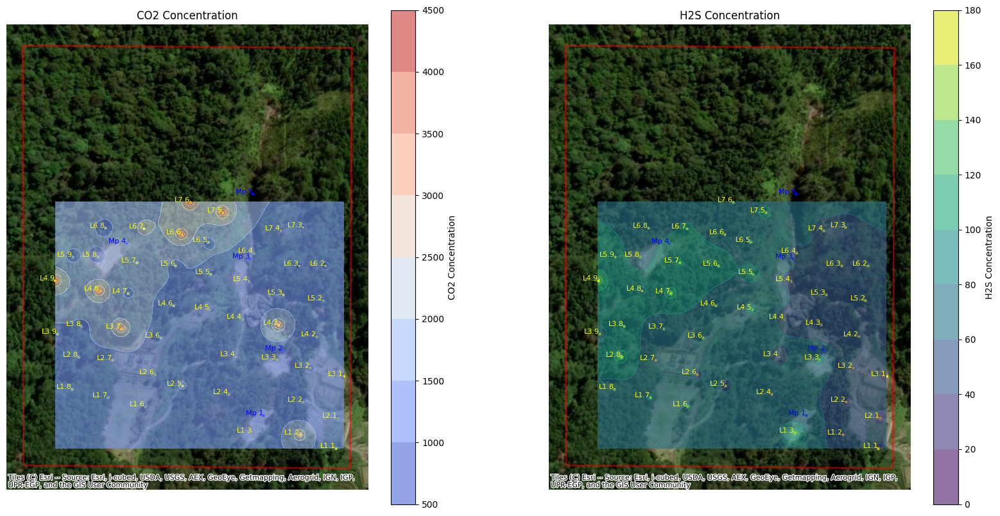

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point
import contextily as ctx
import numpy as np
from scipy.interpolate import griddata

# Define coordinates for the polygon
polygon_coords = [
    (-7.204818, 110.337000),
    (-7.204850, 110.340417),
    (-7.200488, 110.340433),
    (-7.200463, 110.336994)
]

# Convert coordinates to (longitude, latitude) for correct CRS
polygon_coords = [(lon, lat) for lat, lon in polygon_coords]

# Create a GeoDataFrame with a polygon
polygon = Polygon(polygon_coords)
gdf_polygon = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

# Define coordinates and titles for the points
points_coords = [
    (110.340282500, -7.204321826),
    (110.340265203, -7.204637578),
    (110.339923325, -7.204155199),
    (110.339999111, -7.203808344),
    (110.340346166, -7.203891272),
    (110.340061679, -7.203476964),
    (110.340130364, -7.203108569),
    (110.340156030, -7.202746279),
    (110.339879416, -7.202746010),
    (110.339922366, -7.202345407),
    (110.339688363, -7.202380672),
    (110.339715638, -7.203048858),
    (110.339349621, -7.202905524),
    (110.339407205, -7.202613039),
    (110.339284386, -7.203298314),
    (110.339219544, -7.203683904),
    (110.338661949, -7.203988964),
    (110.338271658, -7.204203318),
    (110.339145774, -7.204078214),
    (110.337881229, -7.204110972),
    (110.338371198, -7.203872901),
    (110.339646716, -7.203721476),
    (110.339665661, -7.203359295),
    (110.339890050, -7.204500501),
    (110.339388638, -7.204480637),
    (110.337930404, -7.203726539),
    (110.338430907, -7.203491964),
    (110.338945535, -7.203199682),
    (110.338563736, -7.203159389),
    (110.338590006, -7.202745123),
    (110.338956529, -7.202830510),
    (110.338929504, -7.202499728),
    (110.338654690, -7.202422309),
    (110.339084543, -7.202194797),
    (110.338742183, -7.202085015),
    (110.338261188, -7.202359577),
    (110.337856066, -7.202350282),
    (110.337773186, -7.202651341),
    (110.337510278, -7.202655390),
    (110.337333416, -7.202897510),
    (110.338184900, -7.202715148),
    (110.338091369, -7.203029635),
    (110.337794136, -7.203004380),
    (110.338021540, -7.203395771),
    (110.337575025, -7.203690954),
    (110.337603677, -7.203374884),
    (110.337349813, -7.203449699),
    (110.337503729, -7.204024966)
]

titles = [
    "L2.1", "L1.1", "L2.2", "L3.2", "L3.1", "L4.2", "L5.2", "L6.2", "L6.3", "L7.3",
    "L7.4", "L5.3", "L5.4", "L6.4", "L4.4", "L3.4", "L2.5", "L1.6", "L2.4", "L1.7",
    "L2.6", "L3.3", "L4.3", "L1.2", "L1.3", "L2.7", "L3.6", "L4.5", "L4.6", "L5.6",
    "L5.5", "L6.5", "L6.6", "L7.5", "L7.6", "L6.7", "L6.8", "L5.8", "L5.9", "L4.9",
    "L5.7", "L4.7", "L4.8", "L3.7", "L2.8", "L3.8", "L3.9", "L1.8"
]

# CO2 measurements
co2_measurements = [
    671, 825, 656, 581, 656, 581, 656, 565, 565, 581, 565, 781, 565, 565, 687, 871,
    1850, 671, 656, 734, 656, 718, 5000, 3787, 734, 612, 687, 671, 596, 687, 918, 596,
    5000, 5000, 5000, 2934, 703, 581, 596, 5000, 1787, 765, 5000, 5000, 687, 687, 918, 781
]

# H2S measurements
h2s_measurements = [
    13, 18, 14, 21, 10, 25, 42, 51, 38, 51, 36, 32, 24, 39, 22, 32, 34, 94, 50, 88, 31,
    134, 20, 22, 181, 31, 70, 114, 81, 116, 125, 87, 73, 105, 81, 84, 59, 45, 85, 200,
    139, 172, 71, 46, 178, 95, 62, 67
]

# Add fumarol points
fumarol_coords = [
    (110.339507, -7.204299),
    (110.339707, -7.203623),
    (110.339367, -7.202674),
    (110.338074, -7.202516),
    (110.339402, -7.202001)
]

fumarol_titles = ["Mp 1", "Mp 2", "Mp 3", "Mp 4", "Mp 5"]

# Create a GeoDataFrame with points and titles
points = [Point(lon, lat) for lon, lat in points_coords]
gdf_points = gpd.GeoDataFrame({'title': titles, 'co2': co2_measurements, 'h2s': h2s_measurements}, crs="EPSG:4326", geometry=points)

# Create a GeoDataFrame for fumarol points
fumarol_points = [Point(lon, lat) for lon, lat in fumarol_coords]
gdf_fumarol = gpd.GeoDataFrame({'title': fumarol_titles}, crs="EPSG:4326", geometry=fumarol_points)

# Convert all GeoDataFrames to Web Mercator (EPSG:3857) for contextily compatibility
gdf_polygon = gdf_polygon.to_crs(epsg=3857)
gdf_points = gdf_points.to_crs(epsg=3857)
gdf_fumarol = gdf_fumarol.to_crs(epsg=3857)

# Extract coordinates and measurements for interpolation
x = gdf_points.geometry.x
y = gdf_points.geometry.y
co2 = gdf_points['co2']
h2s = gdf_points['h2s']

# Create grid for interpolation
gridx, gridy = np.meshgrid(np.linspace(x.min(), x.max(), 100), np.linspace(y.min(), y.max(), 100))

# Perform IDW interpolation
def idw(x, y, z, xi, yi):
    dist = np.sqrt((x[:, None, None] - xi[None, :, :])**2 + (y[:, None, None] - yi[None, :, :])**2)
    weights = 1 / dist
    weights /= weights.sum(axis=0)
    zi = np.sum(weights * z[:, None, None], axis=0)
    return zi

co2_interp = idw(x.values, y.values, co2.values, gridx, gridy)
h2s_interp = idw(x.values, y.values, h2s.values, gridx, gridy)

# Plot the map
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

# Plot CO2 interpolation
gdf_polygon.plot(ax=ax[0], alpha=0.5, edgecolor="red", facecolor="none", linewidth=2)
gdf_points.plot(ax=ax[0], color="yellow", markersize=5)
gdf_fumarol.plot(ax=ax[0], color="blue", markersize=5)
for x, y, label in zip(gdf_points.geometry.x, gdf_points.geometry.y, gdf_points['title']):
    ax[0].text(x, y, label, fontsize=8, ha='right', color="yellow")
for x, y, label in zip(gdf_fumarol.geometry.x, gdf_fumarol.geometry.y, gdf_fumarol['title']):
    ax[0].text(x, y, label, fontsize=8, ha='right', color="blue")
c1 = ax[0].contourf(gridx, gridy, co2_interp, cmap='coolwarm', alpha=0.6)
fig.colorbar(c1, ax=ax[0], label='CO2 Concentration')
ax[0].set_title('CO2 Concentration')
ax[0].set_axis_off()

# Plot H2S interpolation
gdf_polygon.plot(ax=ax[1], alpha=0.5, edgecolor="red", facecolor="none", linewidth=2)
gdf_points.plot(ax=ax[1], color="yellow", markersize=5)
gdf_fumarol.plot(ax=ax[1], color="blue", markersize=5)
for x, y, label in zip(gdf_points.geometry.x, gdf_points.geometry.y, gdf_points['title']):
    ax[1].text(x, y, label, fontsize=8, ha='right', color="yellow")
for x, y, label in zip(gdf_fumarol.geometry.x, gdf_fumarol.geometry.y, gdf_fumarol['title']):
    ax[1].text(x, y, label, fontsize=8, ha='right', color="blue")
c2 = ax[1].contourf(gridx, gridy, h2s_interp, cmap='viridis', alpha=0.6)
fig.colorbar(c2, ax=ax[1], label='H2S Concentration')
ax[1].set_title('H2S Concentration')
ax[1].set_axis_off()

# Add basemap (satellite)
ctx.add_basemap(ax[0], source=ctx.providers.Esri.WorldImagery)
ctx.add_basemap(ax[1], source=ctx.providers.Esri.WorldImagery)

# Show the map
plt.show()

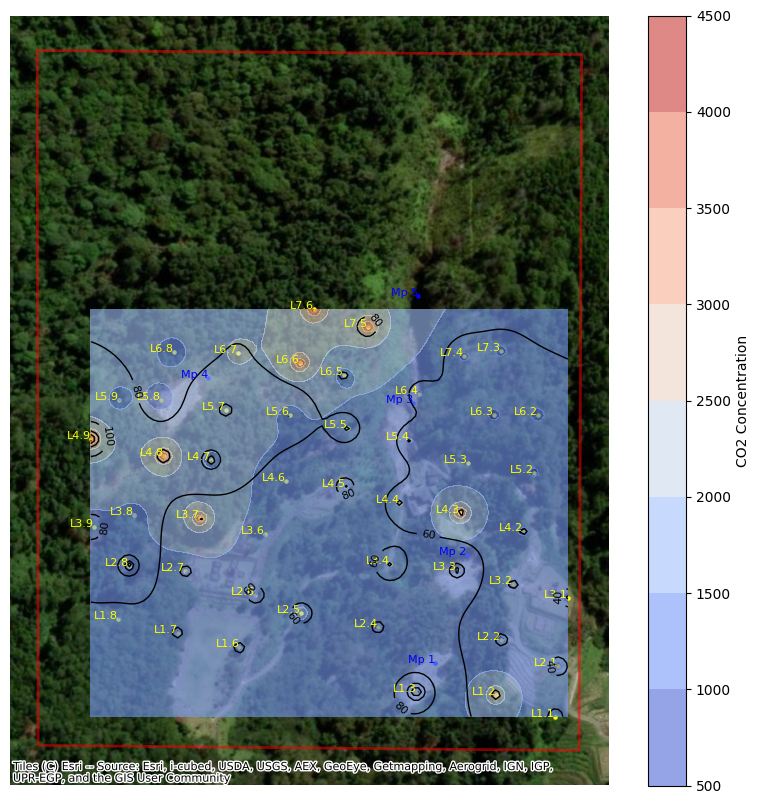

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point
import contextily as ctx
import numpy as np
from scipy.interpolate import griddata

# Define coordinates for the polygon
polygon_coords = [
    (-7.204818, 110.337000),
    (-7.204850, 110.340417),
    (-7.200488, 110.340433),
    (-7.200463, 110.336994)
]

# Convert coordinates to (longitude, latitude) for correct CRS
polygon_coords = [(lon, lat) for lat, lon in polygon_coords]

# Create a GeoDataFrame with a polygon
polygon = Polygon(polygon_coords)
gdf_polygon = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

# Define coordinates and titles for the points
points_coords = [
    (110.340282500, -7.204321826),
    (110.340265203, -7.204637578),
    (110.339923325, -7.204155199),
    (110.339999111, -7.203808344),
    (110.340346166, -7.203891272),
    (110.340061679, -7.203476964),
    (110.340130364, -7.203108569),
    (110.340156030, -7.202746279),
    (110.339879416, -7.202746010),
    (110.339922366, -7.202345407),
    (110.339688363, -7.202380672),
    (110.339715638, -7.203048858),
    (110.339349621, -7.202905524),
    (110.339407205, -7.202613039),
    (110.339284386, -7.203298314),
    (110.339219544, -7.203683904),
    (110.338661949, -7.203988964),
    (110.338271658, -7.204203318),
    (110.339145774, -7.204078214),
    (110.337881229, -7.204110972),
    (110.338371198, -7.203872901),
    (110.339646716, -7.203721476),
    (110.339665661, -7.203359295),
    (110.339890050, -7.204500501),
    (110.339388638, -7.204480637),
    (110.337930404, -7.203726539),
    (110.338430907, -7.203491964),
    (110.338945535, -7.203199682),
    (110.338563736, -7.203159389),
    (110.338590006, -7.202745123),
    (110.338956529, -7.202830510),
    (110.338929504, -7.202499728),
    (110.338654690, -7.202422309),
    (110.339084543, -7.202194797),
    (110.338742183, -7.202085015),
    (110.338261188, -7.202359577),
    (110.337856066, -7.202350282),
    (110.337773186, -7.202651341),
    (110.337510278, -7.202655390),
    (110.337333416, -7.202897510),
    (110.338184900, -7.202715148),
    (110.338091369, -7.203029635),
    (110.337794136, -7.203004380),
    (110.338021540, -7.203395771),
    (110.337575025, -7.203690954),
    (110.337603677, -7.203374884),
    (110.337349813, -7.203449699),
    (110.337503729, -7.204024966)
]

titles = [
    "L2.1", "L1.1", "L2.2", "L3.2", "L3.1", "L4.2", "L5.2", "L6.2", "L6.3", "L7.3",
    "L7.4", "L5.3", "L5.4", "L6.4", "L4.4", "L3.4", "L2.5", "L1.6", "L2.4", "L1.7",
    "L2.6", "L3.3", "L4.3", "L1.2", "L1.3", "L2.7", "L3.6", "L4.5", "L4.6", "L5.6",
    "L5.5", "L6.5", "L6.6", "L7.5", "L7.6", "L6.7", "L6.8", "L5.8", "L5.9", "L4.9",
    "L5.7", "L4.7", "L4.8", "L3.7", "L2.8", "L3.8", "L3.9", "L1.8"
]

# CO2 measurements
co2_measurements = [
    671, 825, 656, 581, 656, 581, 656, 565, 565, 581, 565, 781, 565, 565, 687, 871,
    1850, 671, 656, 734, 656, 718, 5000, 3787, 734, 612, 687, 671, 596, 687, 918, 596,
    5000, 5000, 5000, 2934, 703, 581, 596, 5000, 1787, 765, 5000, 5000, 687, 687, 918, 781
]

# H2S measurements
h2s_measurements = [
    13, 18, 14, 21, 10, 25, 42, 51, 38, 51, 36, 32, 24, 39, 22, 32, 34, 94, 50, 88, 31,
    134, 20, 22, 181, 31, 70, 114, 81, 116, 125, 87, 73, 105, 81, 84, 59, 45, 85, 200,
    139, 172, 71, 46, 178, 95, 62, 67
]

# Add fumarol points
fumarol_coords = [
    (110.339507, -7.204299),
    (110.339707, -7.203623),
    (110.339367, -7.202674),
    (110.338074, -7.202516),
    (110.339402, -7.202001)
]

fumarol_titles = ["Mp 1", "Mp 2", "Mp 3", "Mp 4", "Mp 5"]

# Create a GeoDataFrame with points and titles
points = [Point(lon, lat) for lon, lat in points_coords]
gdf_points = gpd.GeoDataFrame({'title': titles, 'co2': co2_measurements, 'h2s': h2s_measurements}, crs="EPSG:4326", geometry=points)

# Create a GeoDataFrame for fumarol points
fumarol_points = [Point(lon, lat) for lon, lat in fumarol_coords]
gdf_fumarol = gpd.GeoDataFrame({'title': fumarol_titles}, crs="EPSG:4326", geometry=fumarol_points)

# Convert all GeoDataFrames to Web Mercator (EPSG:3857) for contextily compatibility
gdf_polygon = gdf_polygon.to_crs(epsg=3857)
gdf_points = gdf_points.to_crs(epsg=3857)
gdf_fumarol = gdf_fumarol.to_crs(epsg=3857)

# Extract coordinates and measurements for interpolation
x = gdf_points.geometry.x
y = gdf_points.geometry.y
co2 = gdf_points['co2']
h2s = gdf_points['h2s']

# Create grid for interpolation
gridx, gridy = np.meshgrid(np.linspace(x.min(), x.max(), 100), np.linspace(y.min(), y.max(), 100))

# Perform IDW interpolation
def idw(x, y, z, xi, yi):
    dist = np.sqrt((x[:, None, None] - xi[None, :, :])**2 + (y[:, None, None] - yi[None, :, :])**2)
    weights = 1 / dist
    weights /= weights.sum(axis=0)
    zi = np.sum(weights * z[:, None, None], axis=0)
    return zi

co2_interp = idw(x.values, y.values, co2.values, gridx, gridy)
h2s_interp = idw(x.values, y.values, h2s.values, gridx, gridy)

# Plot the map
fig, ax = plt.subplots(figsize=(10, 10))

# Plot CO2 interpolation
gdf_polygon.plot(ax=ax, alpha=0.5, edgecolor="red", facecolor="none", linewidth=2)
gdf_points.plot(ax=ax, color="yellow", markersize=5)
gdf_fumarol.plot(ax=ax, color="blue", markersize=5)
for x, y, label in zip(gdf_points.geometry.x, gdf_points.geometry.y, gdf_points['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="yellow")
for x, y, label in zip(gdf_fumarol.geometry.x, gdf_fumarol.geometry.y, gdf_fumarol['title']):
    ax.text(x, y, label, fontsize=8, ha='right', color="blue")
c1 = ax.contourf(gridx, gridy, co2_interp, cmap='coolwarm', alpha=0.6)
fig.colorbar(c1, ax=ax, label='CO2 Concentration')

# Plot H2S interpolation
c2 = ax.contour(gridx, gridy, h2s_interp, colors='black', linewidths=1)
ax.clabel(c2, inline=True, fontsize=8, fmt='%1.0f')

# Add basemap (satellite)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Remove axis
ax.set_axis_off()

# Show the map
plt.show()

# try load kmz

In [ ]:
!pip install simplekml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for simplekml: filename=simplekml-1.3.6-py3-none-any.whl size=65860 sha256=bf5b63eb93fc369192c18ada9ccaf4665a9112fb6df0101b1f210bc41779af92
  Stored in directory: /root/.cache/pip/wheels/72/3e/80/c3e5c354c3cbe62d8c5e4fb63d9e7cdccc7f93399997ae465f
Successfully built simplekml


In [ ]:
import zipfile
from fastkml import kml

def extract_kmz(kmz_file):
    with zipfile.ZipFile(kmz_file, 'r') as kmz:
        # Extract the KML file from the KMZ archive
        kml_file = [name for name in kmz.namelist() if name.endswith('.kml')][0]
        with kmz.open(kml_file) as kml:
            kml_content = kml.read()
    return kml_content

def parse_kml(kml_content):
    k = kml.KML()
    k.from_string(kml_content)
    return k

# Path to your KMZ file
kmz_file = '/content/Data Geotermal Terbaru.kmz'

# Extract and parse the KML content
kml_content = extract_kmz(kmz_file)
k = parse_kml(kml_content)

# Example: Print all placemarks
for feature in k.features():
    for placemark in feature.features():
        print(f"Name: {placemark.name}")
        print(f"Description: {placemark.description}")
        if placemark.geometry:
            print(f"Coordinates: {placemark.geometry.coords}")

TypeError: 'list' object is not callable